# 2. Image Enhancement

## Table of Contents
1. [Libraries](#libraries)
2. [Histogram Equalization](#hist)
3. [Denoising with Filters](#denoising)
4. [Challenge](#challenge)
5. [Ejercicio #1](#eje1)
6. [Ejercicio #2](#eje2)
7. [Ejercicio #3](#eje3)

**Equipo #14**

José Luis Parada Gutiérrez - A00939669

Julian Jesús Moreno Ovando - A01795915

Mario Raúl García Ramírez - A01658682

Juan Pablo Carvajal Acosta - A01796843


## Importing Libraries <a class="anchor" id="libraries" ></a>

In [47]:
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.image as mpimg
from skimage import exposure
import skimage
from scipy.ndimage.filters import gaussian_filter as gauss
from scipy.ndimage.filters import median_filter as med
import cv2

/tmp/ipython-input-3972790099.py:7: DeprecationWarning: Please import `gaussian_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import gaussian_filter as gauss
/tmp/ipython-input-3972790099.py:8: DeprecationWarning: Please import `median_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import median_filter as med


In [48]:
import os
from google.colab import drive
drive.mount('/content/drive')
DIR = "/content/drive/MyDrive/Vision"
os.chdir(DIR)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


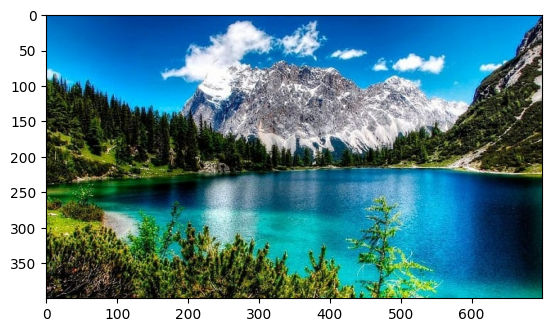

In [49]:
original_image = Image.open('data/image.jpg')
plt.imshow(original_image)
type(original_image)

# Save the image
np.save('data/img.npy', original_image)

#Load the image
original_image = np.load('data/img.npy')

## Histogram Equalization<a class="anchor" id="hist" ></a>

Let's look at the distribution of pixel values in the image.

Ideally, the image should have relatively even distribution of values, indicating good contrast and making it easier to extract analytical information.

An easy way to check this is to plot a histogram.

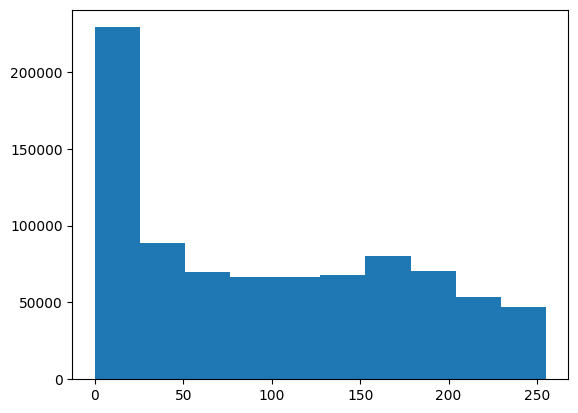

In [50]:
# Plot a histogram - we need to use ravel to "flatten" the 3 dimensions
plt.hist(original_image.ravel())
plt.show()

Another useful way to visualize the statistics of an image is as a cumulative distribution function (CDF) plot. Which shows the cumulative pixel intensity frequencies from 0 to 255.

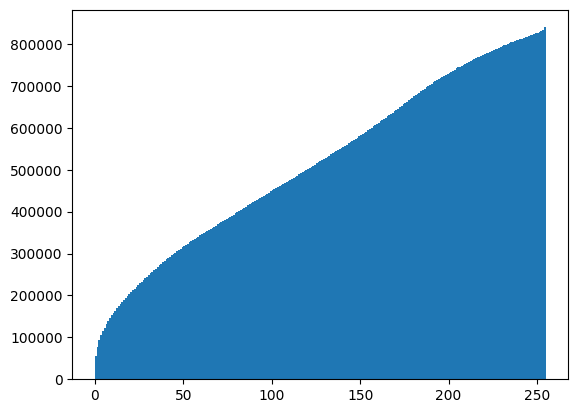

In [51]:
plt.hist(original_image.ravel(), bins=255, cumulative=True)
plt.show()

The histogram and CDF for our image show pretty uneven distribution - there's a lot of contrast in the image. Ideally we should equalize the values in the images we want to analyse to try to make our images more consistent in terms of the shapes they contain irrespective of light levels.

Histogram equalization is often used to improve the statistics of images. In simple terms, the histogram equalization algorithm attempts to adjust the pixel values in the image to create a more uniform distribution. The code in the cell below uses the  **exposure.equalize_hist** method from the **skimage** package to equalize the image.  

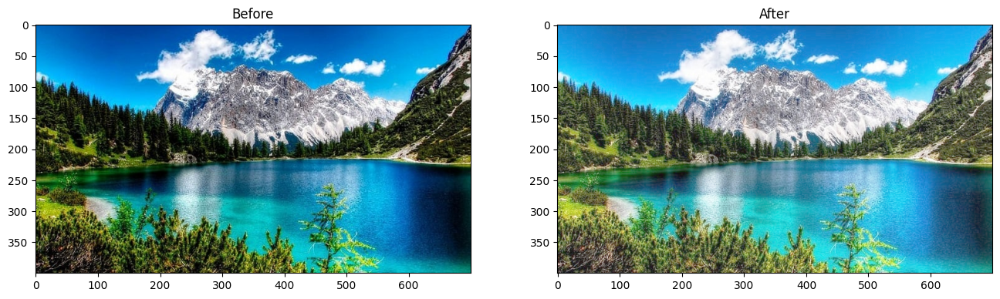

In [52]:
original_image_eq = exposure.equalize_hist(original_image)

fig = plt.figure(figsize=(16, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.imshow(original_image)
a.set_title('Before')

# Subplot for processed image
a=fig.add_subplot(1,2,2)
imgplot = plt.imshow(original_image_eq)
a.set_title('After')

plt.show()

As with most image operations, there's more than one way to do this. For example, you could also use the **PIL.ImgOps.equalize** method:

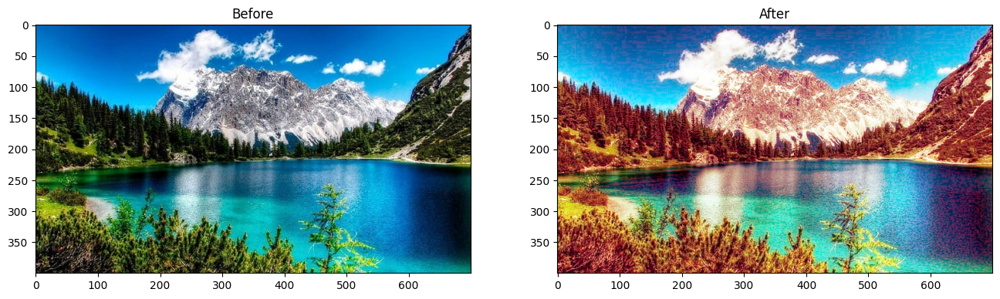

In [53]:

# Equalize the image - but we need to convert the numpy array back to the PIL image format
image_PIL_eq = ImageOps.equalize(Image.fromarray(original_image))

# Display using matplotlib

# Create a figure
fig = plt.figure(figsize=(16, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.imshow(original_image)
a.set_title('Before')

# Subplot for processed image
a=fig.add_subplot(1,2,2)
imgplot = plt.imshow(image_PIL_eq)
a.set_title('After')

plt.show()

Now let's see what that's done to the histogram and CDF plots:

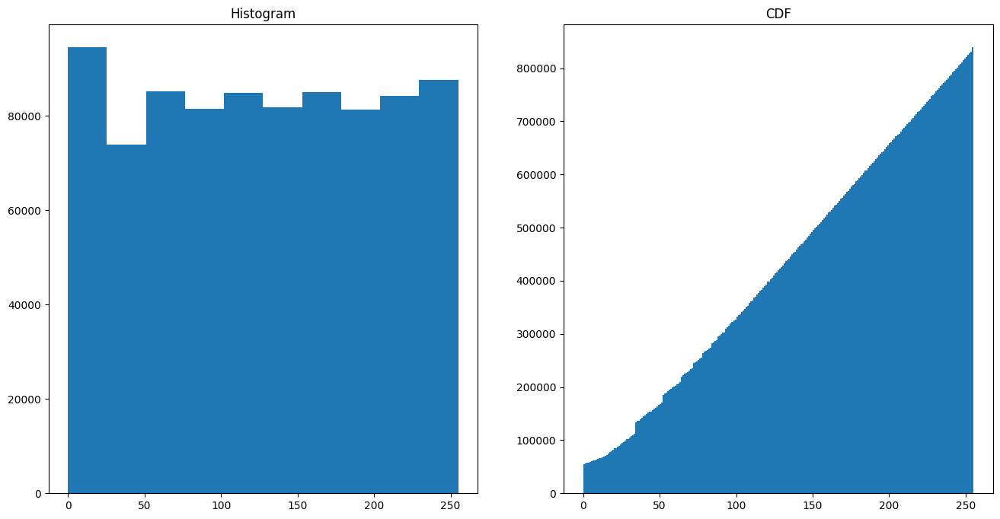

In [54]:
# Display histograms
img_eq = np.array(image_PIL_eq)

# Create a figure
fig = plt.figure(figsize=(16, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.hist(img_eq.ravel())
a.set_title('Histogram')

# Subplot for processed image
a=fig.add_subplot(1,2,2)
imgplot = plt.hist(img_eq.ravel(), bins=255, cumulative=True)
a.set_title('CDF')

plt.show()

The pixel intensities are more evenly distributed in the equalized image. In particular, the cumulative density shows a straight diagonal cumulation; which is a good sign that the pixel intensity values have been equalized.

## Denoising with Filters <a class="anchor" id="denoising" ></a>

Often images need to be cleaned up to remove "salt and pepper" noise.

### Add Some Random Noise
Let's add some random noise to our image - such as you might see in a photograph taken in low light or at a low resolution.

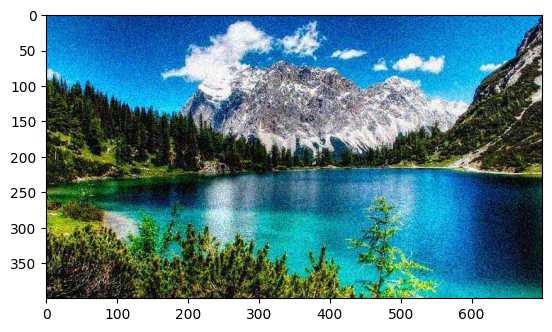

In [55]:
img_n = skimage.util.random_noise(original_image)
plt.imshow(img_n)

### Using a Gaussian Filter
A Gaussian filter applies a weighted average (mean) value for pixels based on the pixels that surround them.

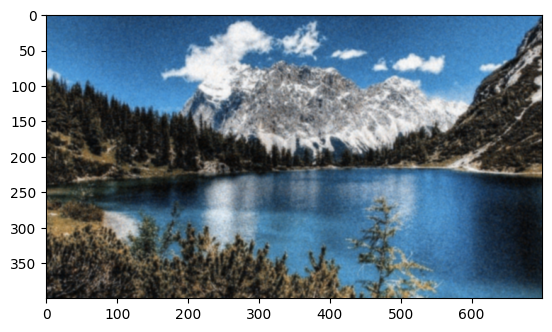

In [56]:
img3_gauss = gauss(img_n, sigma=1)
plt.imshow(img3_gauss)

### Using a Median Filter
The Gaussian filter results in a blurred image, which may actually be better for feature extraction as it makes it easier to find contrasting areas. If it's too blurred, we could try a median filter, which as the name suggests applies the median value to pixels based on the pixels around them.

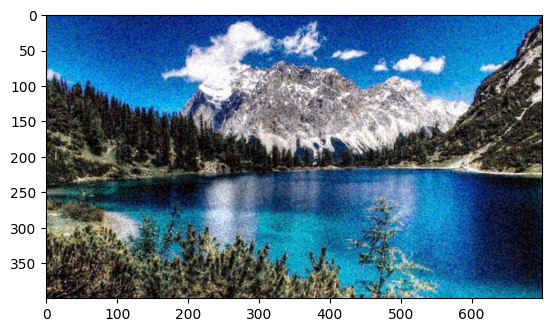

In [57]:
img_med = med(img_n, size=2)
plt.imshow(img_med)

## Challenge <a class="anchor" id="challenge" ></a>

Now, try solving this challenge, you must equalize different windows of the same image in a splitted way.

In [58]:
def slice(image_path, n_slices=4):
    """
    Divide una imagen en n_slices partes (asumiendo una cuadrícula cuadrada)
    Para n=4, crea una cuadrícula de 2x2
    """
    # Abrir la imagen
    img = Image.open(image_path)
    width, height = img.size  # Obtener ancho y alto de la imagen

    # Calcular dimensiones de la cuadrícula
    grid_size = int(np.sqrt(n_slices))  # Número de filas/columnas de la cuadrícula
    slice_width = width // grid_size     # Ancho de cada rebanada
    slice_height = height // grid_size   # Alto de cada rebanada

    slices = []  # Lista para almacenar los nombres de los archivos generados

    # Crear las rebanadas recorriendo filas y columnas
    for row in range(grid_size):
        for col in range(grid_size):
            left = col * slice_width          # Coordenada X del borde izquierdo
            top = row * slice_height          # Coordenada Y del borde superior
            right = left + slice_width        # Coordenada X del borde derecho
            bottom = top + slice_height       # Coordenada Y del borde inferior

            # Cortar la rebanada de la imagen
            slice_img = img.crop((left, top, right, bottom))

            # Guardar la rebanada con convención de nombres similar a image_slicer
            slice_filename = f'data/image_{row+1:02d}_{col+1:02d}.png'

            # Crear carpeta 'data' si no existe
            os.makedirs('data', exist_ok=True)
            slice_img.save(slice_filename)  # Guardar la rebanada en disco
            slices.append(slice_filename)   # Agregar nombre a la lista

    # Devolver lista de archivos generados
    return slices

In [59]:
# from image_slicer import slice

n = 4
slice('data/image.jpg', n)

['data/image_01_01.png',
 'data/image_01_02.png',
 'data/image_02_01.png',
 'data/image_02_02.png']

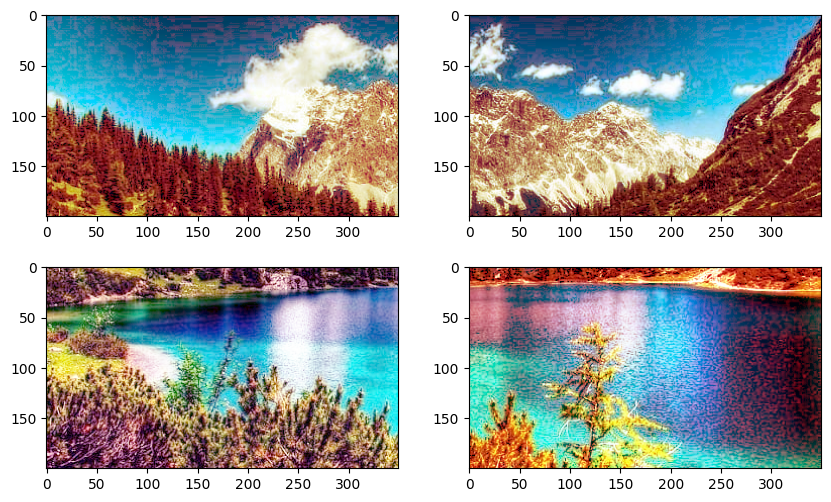

In [60]:
fig = plt.figure(figsize=(10, 6))

plt.subplot(2,2,1)
img = Image.open(f'data/image_01_01.png')
img_eq = ImageOps.equalize(img)
plt.imshow(img_eq)

plt.subplot(2,2,2)
img = Image.open(f'data/image_01_02.png')
img_eq = ImageOps.equalize(img)
plt.imshow(img_eq)

plt.subplot(2,2,3)
img = Image.open(f'data/image_02_01.png')
img_eq = ImageOps.equalize(img)
plt.imshow(img_eq)

plt.subplot(2,2,4)
img = Image.open(f'data/image_02_02.png')
img_eq = ImageOps.equalize(img)
plt.imshow(img_eq)

plt.show()

In [61]:
def plot_images(img1, img2, title1="Image 1", title2="Image 2", figsize=(15,5)):
    """
    Muestra dos imágenes lado a lado usando matplotlib, haciendo más elegante la presentación en lineas posteriores.
    Args:
        img1: Primera imagen (formato BGR de OpenCV).
        img2: Segunda imagen (formato BGR de OpenCV).
        title1 (str): Título para la primera imagen.
        title2 (str): Título para la segunda imagen.
        figsize (tuple): Tamaño de la figura (ancho, alto).
    """

    plt.figure(figsize=figsize)

    # Primera imagen
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    plt.title(title1)
    plt.axis('off')

    # Segunda imagen
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    plt.title(title2)
    plt.axis('off')

    plt.show()

---
## Ejercicio #1 <a name="eje1"></a>
### Ecualización de Histograma Basada en Mosaicos (AHE)

La **Ecualización Adaptativa de Histograma (AHE)**, a veces llamada **Ecualización basada en mosaicos**, es una técnica para mejorar el contraste en las imágenes. A diferencia de la ecualización global que trabaja con la imagen entera de una sola vez, AHE divide la imagen en varias secciones pequeñas, conocidas como mosaicos o tiles, y mejora el contraste de cada una por separado.

Esta capacidad para adaptarse localmente es clave para sacar a la luz detalles en zonas con diferente iluminación. En estas situaciones, los métodos globales no funcionan bien porque el histograma general es sesgado por las áreas más grandes, ya sean muy claras u oscuras.

#### **Mecanismo**

1. **Definir vecindario (mosaico o tile)**: Se establece una región alrededor de cada píxel.  
2. **Calcular histograma local**: Se obtiene el histograma de intensidades para ese vecindario.  
3. **Aplicar transformación**: Se usa el histograma calculado para transformar únicamente el píxel central.  
4. **Repetir el proceso**: El vecindario se desplaza a lo largo de toda la imagen.



#### **Problemas de AHE y la Solución: CLAHE**

- **Amplificación de Ruido**: en zonas uniformes, el histograma es muy concentrado y AHE exagera el contraste, haciendo visible el ruido.

- **Artefactos de Bloque**: al procesar mosaicos de forma aislada, los bordes entre ellos generan un “efecto tablero de ajedrez”.

La solución es CLAHE (Contrast Limited Adaptive Histogram Equalization), que mejora el método con:

- **Límite de Contraste**: restringe la altura del histograma en cada mosaico para controlar el ruido.

- **Interpolación Bilineal**: suaviza la transición entre mosaicos, eliminando los bordes marcados.


Otro inconveniente es que se puede observar posibles diferencias entre los el contraste de los bloques, ¿cómo podría mejorarse?

para mejorar esas diferencias se puede:

Ajustar el tamaño de mosaico.

*   Ajustar el tamaño de mosaico.

*   Aplicar interpolación entre tiles.

*   Usar un límite de contraste como en CLAHE.



Aplicar interpolación entre tiles.

Usar un límite de contraste como en CLAHE.

#### **Referencias**

- Gonzalez, R. C., & Woods, R. E. (2018). *Digital image processing* (4th ed.). Pearson.  

- Pizer, S. M., Amburn, E. P., Austin, J. D., Cromartie, R., Geselowitz, A., Greer, T., Romeny, B. H., Zimmerman, J. B., & Zuiderveld, K. (1987). Adaptive histogram equalization and its variations. *Computer Vision, Graphics, and Image Processing, 39*(3), 355–368. https://doi.org/10.1016/S0734-189X(87)80186-X  
- Mohan, S. (2020, abril 19). OpenCV Tutorial – Image Colorspace Conversion using cv2.cvtColor(). Machine Learning Knowledge. https://machinelearningknowledge.ai/opencv-tutorial-image-colorspace-conversion-using-cv2-cvtcolor/


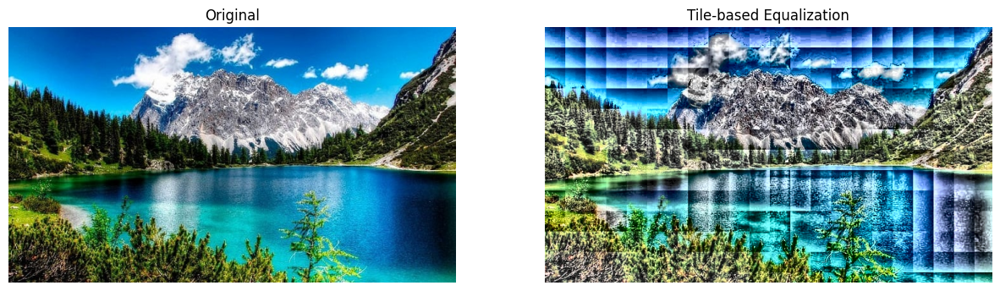

In [72]:
def tile_hist_eq(image, tile_size=64):
    """Ecualización por tiles (AHE)"""
    h, w = image.shape
    result = image.copy()

    for y in range(0, h, tile_size):
        for x in range(0, w, tile_size):
            tile = result[y:y+tile_size, x:x+tile_size]
            result[y:y+tile_size, x:x+tile_size] = cv2.equalizeHist(tile)

    return result

# Cargar y procesar imagen
img = cv2.imread("data/image.jpg")
lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

# Aplicar ecualización solo al canal L
lab[:, :, 0] = tile_hist_eq(lab[:, :, 0], tile_size=32)
result = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

# Mostrar resultado
plot_images(img, result, "Original", "Tile-based Equalization")

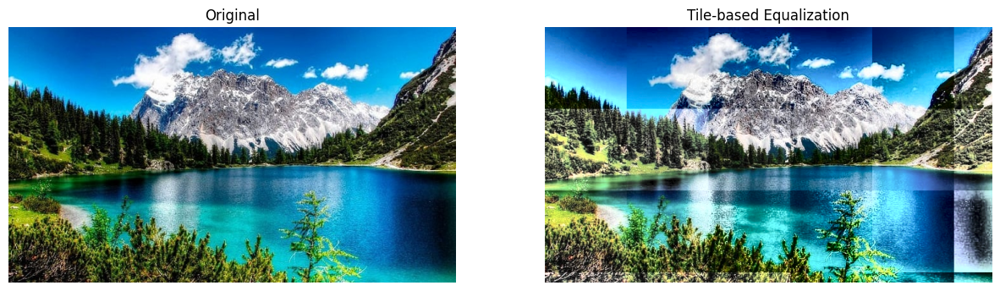

In [63]:
lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
# Aplicamos ecualización solo al canal L, con otro tamaño de ventana
lab[:, :, 0] = tile_hist_eq(lab[:, :, 0], tile_size=128)
result = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

# Mostramos resultado
plot_images(img, result, "Original", "Tile-based Equalization")

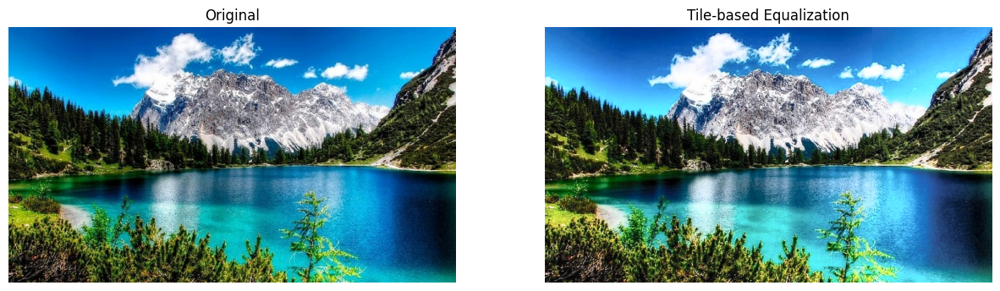

In [64]:
lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
# Aplicamos ecualización solo al canal L, con otro tamaño de ventana
lab[:, :, 0] = tile_hist_eq(lab[:, :, 0], tile_size=512)
result = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

# Mostramos resultado
plot_images(img, result, "Original", "Tile-based Equalization")

---
## Ejercicio #2 <a name="eje2"></a>
### Ecualización Adaptativa del Histograma con Ventana Deslizante (SWAHE)

La **Ecualización Adaptativa del Histograma con Ventana Deslizante**  
(*Sliding Window Adaptive Histogram Equalization*) es un método de **procesamiento de histogramas local**,  
donde la transformación de intensidad de cada píxel se calcula a partir de un **vecindario pequeño** alrededor del píxel central,  
en lugar de usar la distribución de toda la imagen.  

Esto permite mejorar detalles sutiles en áreas pequeñas que los métodos globales no pueden realzar, aunque con un costo computacional muy elevado.  

#### **Mecanismo**

1. **Definir ventana de análisis**:  
   Se elige un tamaño de ventana (por ejemplo, 65x65 píxeles).  

2. **Centrar en el píxel objetivo**:  
   La ventana se coloca de manera que el píxel central quede en el centro.  

3. **Calcular histograma local**:  
   Se construye el histograma de intensidades de los píxeles contenidos en la ventana.  

4. **Generar y aplicar la transformación**:  
   Con este histograma, se obtiene una función de ecualización que transforma el valor  
   del píxel central.  

5. **Deslizar y repetir**:  
   La ventana avanza píxel por píxel y se repite el proceso hasta cubrir toda la imagen.

#### **Fuentes**

- Gonzalez, R. C., & Woods, R. E. (2018). *Digital image processing* (4th ed.). Pearson.  
- TutorialsPoint. (s.f.). Scikit Image - Local Histogram Equalization. Recuperado el 20 de septiembre de 2025, de https://www.tutorialspoint.com/scikit-image/scikit-image-local-histogram-equalization.htm

- Van der Walt, S., Schönberger, J. L., Nunez-Iglesias, J., Boulogne, F., Warner, J. D., Yager, N., Gouillart, E., & Yu, T. (2025). skimage.filters.rank — skimage 0.25.2 documentation. Recuperado el 20 de septiembre de 2025, de https://scikit-image.org/docs/stable/api/skimage.filters.rank.html#skimage.filters.rank.equalize

- Van der Walt, S., Schönberger, J. L., Nunez-Iglesias, J., Boulogne, F., Warner, J. D., Yager, N., Gouillart, E., & Yu, T. (2025). Sliding window histogram — skimage 0.25.2 documentation. Recuperado el 20 de septiembre de 2025, de https://scikit-image.org/docs/0.25.x/auto_examples/features_detection/plot_windowed_histogram.html


In [65]:
from skimage.morphology import disk
from skimage.filters import rank
from skimage import img_as_ubyte

def apply_swahe(img, disk_size=201):
    """
    Aplica SWAHE (Sliding Window Adaptive Histogram Equalization) a la componente L
    de la imagen en espacio de color LAB.

    Args:
        img: Imagen a procesar.
        disk_size: Tamaño del disco para el algoritmo rank.equalize.

    Returns:
        result_swahe (numpy.ndarray): Imagen final en formato BGR.
    """

    # Convertir a LAB
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

    # Separar canales
    l_channel, a_channel, b_channel = cv2.split(lab)

    # Convertir a uint8
    l_channel = img_as_ubyte(l_channel)

    # Aplicar SWAHE
    l_channel_swahe = rank.equalize(l_channel, disk(disk_size))

    # Unir canales y volver a BGR
    lab_swahe = cv2.merge((l_channel_swahe, a_channel, b_channel))
    result_swahe = cv2.cvtColor(lab_swahe, cv2.COLOR_LAB2BGR)

    return result_swahe

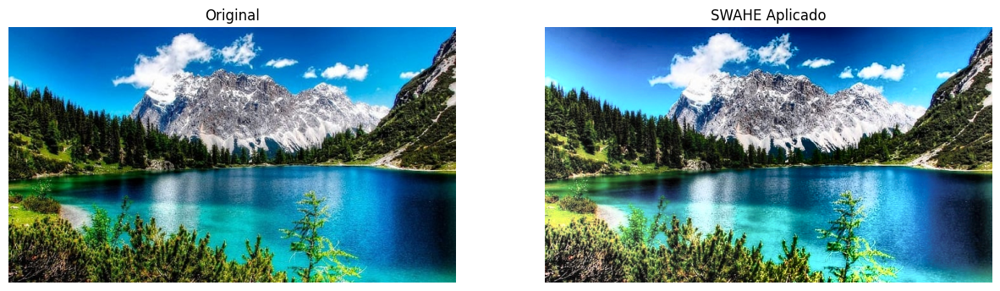

In [66]:
img = cv2.imread("data/image.jpg")
img_swahe = apply_swahe(img, disk_size=201)
plot_images(img, img_swahe, "Original", "SWAHE Aplicado")

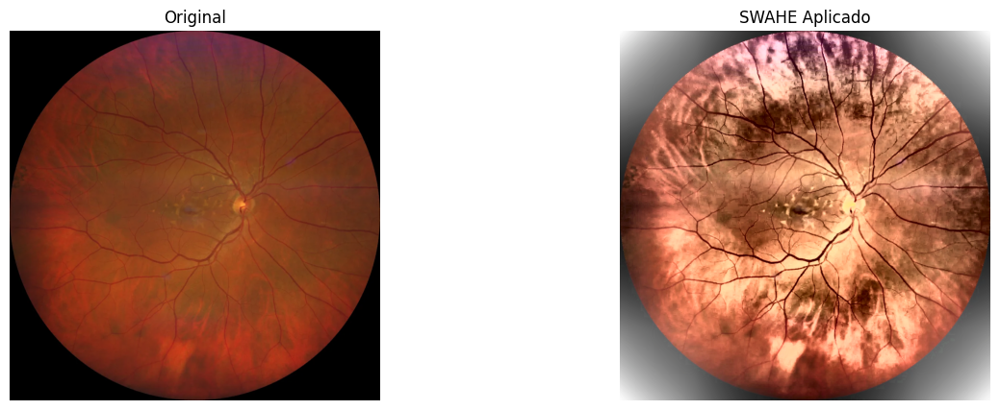

In [68]:
img = cv2.imread('data2/image16.jpg')
img_swahe = apply_swahe(img, disk_size=201)
plot_images(img, img_swahe, "Original", "SWAHE Aplicado")

---
## Ejercicio #3 <a name="eje3"></a>
### Ecualización Adaptativa del Histograma con Límite de Contraste (CLAHE)

La **Ecualización Adaptativa del Histograma con Límite de Contraste**  
(*Contrast Limited Adaptive Histogram Equalization, CLAHE*) es la versión refinada y más utilizada de la ecualización adaptativa. Fue diseñada para resolver los dos problemas principales del AHE básico: la **amplificación de ruido** y los **artefactos de bloque**.  

Gracias a estas mejoras, CLAHE se ha convertido en el método estándar para la mejora de contraste local en una gran variedad de aplicaciones, desde imágenes médicas hasta fotografía computacional, ofreciendo resultados de alta calidad de manera eficiente.


## Mecanismo

1. **Definir un vecindario (mosaico o ventana)**:  
   Se establece un vecindario de tamaño específico alrededor del píxel central.  

2. **Mover el vecindario**:  
   El centro de la ventana se desplaza píxel a píxel a lo largo de toda la imagen.  

3. **Calcular histograma local**:  
   Se obtiene el histograma de los píxeles dentro de la ventana.  

4. **Aplicar transformación local**:  
   A partir del histograma local se obtiene una función de ecualización adaptativa que se aplica solo al píxel central.  

5. **Repetir el proceso**:  
   El vecindario se desplaza a la siguiente ubicación y el proceso se repite para todos los píxeles.  

#### **Fuentes**

- Gonzalez, R. C., & Woods, R. E. (2018). *Digital image processing* (4th ed.). Pearson.  
- Campos, G. F., Mastelini, S. M., Aguiar, G. J., Mantovani, R. G., de Melo, L. F., & Barbon Jr, S. (2019). Machine learning hyperparameter selection for Contrast Limited Adaptive Histogram Equalization. EURASIP Journal on Image and Video Processing, 2019(1), 59. https://doi.org/10.1186/s13640-019-0445-4
- Zavala, F. (2025, marzo 17). Histogram equalization CLAHE algorithm. Medium. https://medium.com/@fjzavala/histogram-equalization-clahe-algorithm-8841d402fc76
- Rosebrock, A. (2021, febrero 1). OpenCV Histogram Equalization and Adaptive Histogram Equalization (CLAHE). PyImageSearch. https://pyimagesearch.com/2021/02/01/opencv-histogram-equalization-and-adaptive-histogram-equalization-clahe

In [69]:
def apply_clahe(img, clip_limit=2.0, tile_grid_size=(8,8)):
    """
    Aplica CLAHE (Contrast Limited Adaptive Histogram Equalization) a una imagen.

    CLAHE divide la imagen en mosaicos (tiles) y aplica ecualización de histograma local
    en cada tile, limitando el contraste máximo para evitar sobreamplificación del ruido.

    Args:
        image_path: Imagen a procesar.
        clip_limit (float): Límite para el contraste (valores típicos 2.0-5.0).
        tile_grid_size (tuple): Tamaño de la cuadrícula de mosaicos, ej. (8,8).

    Returns:
        original_img (np.array): Imagen original.
        clahe_img (np.array): Imagen con CLAHE aplicado.
        hist_eq_img (np.array): Imagen con ecualización de histograma global.
    """

    # Convertir a LAB (Luminancia + color)
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l_channel, a_channel, b_channel = cv2.split(lab)

    # Aplicar CLAHE al canal L
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    l_clahe = clahe.apply(l_channel)

    # Aplicar ecualización de histograma global para comparación
    l_hist_eq = cv2.equalizeHist(l_channel)

    # Reconstruir imágenes
    lab_clahe = cv2.merge((l_clahe, a_channel, b_channel))
    lab_hist_eq = cv2.merge((l_hist_eq, a_channel, b_channel))

    clahe_img = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2BGR)

    return clahe_img

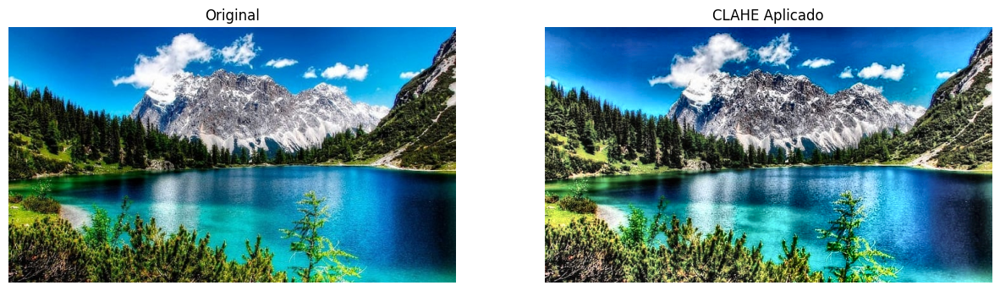

In [70]:
img = cv2.imread("data/image.jpg")
img_clahe = apply_clahe(img, clip_limit=2.0, tile_grid_size=(8,8))
plot_images(img, img_clahe, "Original", "CLAHE Aplicado")

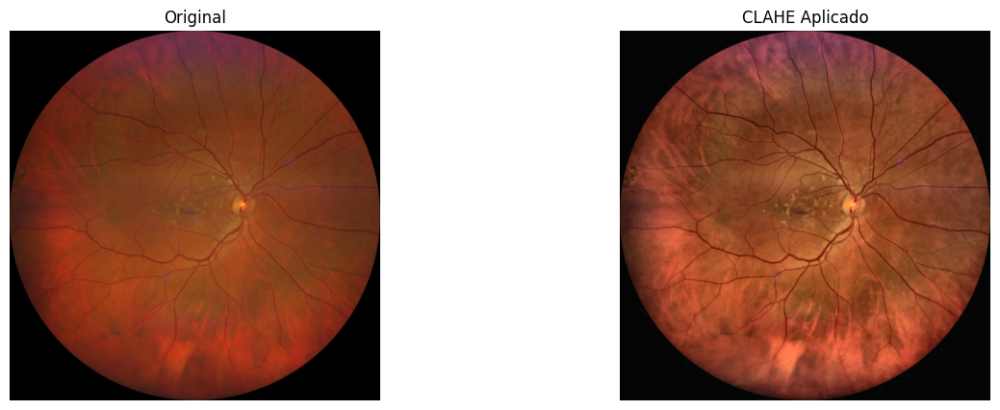

In [71]:
img = cv2.imread('data2/image16.jpg')
img_clahe = apply_clahe(img, clip_limit=2.0, tile_grid_size=(8,8))
plot_images(img, img_clahe, "Original", "CLAHE Aplicado")

### Conclusión

En esta actividad pudimos darnos cuenta de que la ecualización de histograma no es solo una técnica “bonita” para mejorar imágenes, sino un conjunto de herramientas muy útiles que se adaptan a distintas necesidades.  
Vimos cómo el AHE puede mejorar el contraste local, aunque también introduce problemas como ruido o bloques; después entendimos que el SWAHE logra resultados más detallados pero a un costo computacional alto; y finalmente descubrimos que el CLAHE es como la versión optimizada, que combina lo mejor de los anteriores evitando sus principales desventajas.  

Al final, lo que aprendimos es que no existe una única forma de mejorar el contraste de una imagen. Cada método tiene sus pros y contras, y la clave está en elegir el más adecuado según la situación.  
En otras palabras, construimos otra pieza más para nuestra “caja de herramientas” de procesamiento de imágenes, y ahora sabemos cuándo y cómo usarla para resaltar los detalles que realmente importan.  
